# <span style="color:black; font-weight:bold;">8.4 Million MERFISH Mouse Brain Atlas Tutorial</span>
+ <span style="color:black; font-weight:bold;">Creator</span>: Bingjie Dai (17516970902@163.com)
+ <span style="color:black; font-weight:bold;">Date of Creation</span>: 10.14.2025
+ <span style="color:black; font-weight:bold;">Date of Last Modification</span>: 10.14.2025
### <span style="color:black; font-weight:bold;">Download</span>: 8.4 Million MERFISH Mouse Brain Atlas data used in the tutorial are available at [MERFISH_animal1.h5ad](https://drive.google.com/open?id=193Igb0H7purVCTSBYjMuhSqUlJ6lHAnQ&usp=drive_fs) , [MERFISH_animal2.h5ad](https://drive.google.com/open?id=1xTO8Wgs1_6eNeXeQF_3TMgUghrASvdS1&usp=drive_fs) , [MERFISH_animal3_sagittal.h5ad](https://drive.google.com/open?id=19djKdcK8MI-p0fC0fj_G81LK6tUNzlye&usp=drive_fs) and [MERFISH_animal4.h5ad](https://drive.google.com/open?id=1KW5HgTE3zthYJZ5SnhIBV1LOyiYUN8xv&usp=drive_fs)
In this tutorial we apply SpaLP to 4 batches (239 slices) Integration (MERFISH_animal1/2/3/4) of the 8.4 Million MERFISH Mouse Brain Atlas dataset from [Zhang, M., Pan, X., Jung, W. et al. Molecularly defined and spatially resolved cell atlas of the whole mouse brain. Nature 624, 343–354 (2023).](https://doi.org/10.1038/s41586-023-06808-9)

<span style="color:black; font-weight:bold;">The dataset have four batches:</span>   
+ <span style="color:black; font-weight:bold;">MERFISH_animal1</span>: 4,167,869 cells, 1122 genes and 147 slices  
+ <span style="color:black; font-weight:bold;">MERFISH_animal2</span>: 1,915,592 cells, 1122 genes and 66 slices   
+ <span style="color:black; font-weight:bold;">MERFISH_animal3</span>: 2,081,549 cells, 1122 genes and 23 slices   
+ <span style="color:black; font-weight:bold;">MERFISH_animal4</span>: 215,278 cells, 1122 genes and 3 slices   
+ <span style="color:black; font-weight:bold;">After integration Total</span>: 8,380,288 cells, 1122 genes and 239 slices

In [1]:
from SpaLP.utils import prepare_inputs, set_seed,create_new_color_dict,Graph
from SpaLP.RandLA import SpatialAutoencoder
import torch
import torch.nn as nn
import torch.optim as optim
import warnings
import scanpy as sc
warnings.filterwarnings("ignore")
import numpy as np
import pandas as pd
import anndata as ad
from tqdm import tqdm
import time

#### <span style="color:black; font-weight:bold;">In this tutorial, we use CPU to train the model, which requires approximately 350GB CPU memory. CPU Runtime：7h</span>

In [2]:
device ='cpu'

In [3]:
set_seed(7)

## <span style="color:black; font-weight:bold;">Loading 8.4 Million MERFISH Mouse Brain Atlas data</span>

In [4]:
adata1=sc.read_h5ad('/home/dbj/SpaLA/Batch/MERFISH/MERFISH_animal1.h5ad')
adata2=sc.read_h5ad('/home/dbj/SpaLA/Batch/MERFISH/MERFISH_animal2.h5ad')
adata3=sc.read_h5ad('/home/dbj/SpaLA/Batch/MERFISH/MERFISH_animal3_sagittal.h5ad')
adata4=sc.read_h5ad('/home/dbj/SpaLA/Batch/MERFISH/MERFISH_animal4.h5ad')

adata1.var_names=adata1.var['gene_name']
adata2.var_names=adata2.var['gene_name']
adata3.var_names=adata3.var['gene_name']
adata4.var_names=adata4.var['gene_name']

adata1,adata2,adata3,adata4

(AnnData object with n_obs × n_vars = 4167869 × 1122
     obs: 'donor_id', 'development_stage_ontology_term_id', 'sex_ontology_term_id', 'self_reported_ethnicity_ontology_term_id', 'disease_ontology_term_id', 'tissue_ontology_term_id', 'cell_type_ontology_term_id', 'assay_ontology_term_id', 'suspension_type', 'cluster_id_transfer', 'subclass_transfer', 'cluster_confidence_score', 'subclass_confidence_score', 'high_quality_transfer', 'major_brain_region', 'ccf_region_name', 'brain_section_label', 'tissue_type', 'is_primary_data', 'cell_type', 'assay', 'disease', 'sex', 'tissue', 'self_reported_ethnicity', 'development_stage', 'observation_joinid'
     var: 'gene_name', 'feature_is_filtered', 'feature_name', 'feature_reference', 'feature_biotype', 'feature_length', 'feature_type'
     uns: 'citation', 'organism', 'organism_ontology_term_id', 'schema_reference', 'schema_version', 'title'
     obsm: 'X_CCF', 'X_spatial_coords', 'X_umap',
 AnnData object with n_obs × n_vars = 1915592 × 1122

In [5]:
adata_list=[adata1,adata2,adata3,adata4]
adata = ad.concat(adata_list, join="inner")

In [6]:
adata.obs['batch']=adata.obs['donor_id']
adata.obs['slice']=adata.obs['brain_section_label']
adata.obsm['spatial']=adata.obsm['X_spatial_coords']

In [7]:
adata

AnnData object with n_obs × n_vars = 8380288 × 1122
    obs: 'donor_id', 'development_stage_ontology_term_id', 'sex_ontology_term_id', 'self_reported_ethnicity_ontology_term_id', 'disease_ontology_term_id', 'tissue_ontology_term_id', 'cell_type_ontology_term_id', 'assay_ontology_term_id', 'suspension_type', 'cluster_id_transfer', 'subclass_transfer', 'cluster_confidence_score', 'subclass_confidence_score', 'high_quality_transfer', 'major_brain_region', 'ccf_region_name', 'brain_section_label', 'tissue_type', 'is_primary_data', 'cell_type', 'assay', 'disease', 'sex', 'tissue', 'self_reported_ethnicity', 'development_stage', 'observation_joinid', 'batch', 'slice'
    obsm: 'X_CCF', 'X_spatial_coords', 'X_umap', 'spatial'

## <span style="color:black; font-weight:bold;">Data preprocessing</span>
We use [scanpy](https://scanpy.readthedocs.io/en/stable/installation.html) package to preprocess each batch separately and combine them as standard processed expression matrix.

In [8]:
adatas = []
for batch in adata.obs['batch'].unique():
    a = adata[adata.obs['batch'] == batch].copy()
    sc.pp.normalize_total(a,inplace=True)
    sc.pp.log1p(a)
    sc.pp.scale(a)
    adatas.append(a)

adata = ad.concat(adatas, join="inner")
adata.obsm['feat']=adata.X

## <span style="color:black; font-weight:bold;">Compute Spatial Neighbor Graph and build the neighbor index matrix</span>
+ We compute the Spatial Graph using 8 neighbors in 8.4 Million MERFISH Mouse Brain Atlas Integration dataset. k=8  
+ We will compute a separate spatial neighbor index matrix for each slice and combine them as disconnected components. 

In [9]:
graphs = []
for batch in adata.obs['slice'].unique():
    a = adata[adata.obs['slice'] == batch].copy()
    graph = prepare_inputs(a, k=8, device=device)
    graphs.append(graph)

In [10]:
all_features = torch.cat([g.features for g in graphs], dim=0)
all_neighbor_idx = []
offset = 0
for g in graphs:
    all_neighbor_idx.append(g.neighbor_idx + offset)
    offset += g.features.shape[0]
all_neighbor_idx = torch.cat(all_neighbor_idx, dim=0)
graph = Graph(all_features, all_neighbor_idx)

## <span style="color:black; font-weight:bold;">Define Parameters</span>
+ The hidden layer dimension is 50, the Adam optimizer is used to optimize the model, the learning rate lr is 0.001, and the model is trained for 100 epochs.

In [11]:
in_channels = graph.features.shape[1]
model = SpatialAutoencoder(in_channels, out_channels=50).to(device)
criterion = nn.MSELoss()
optimizer = optim.Adam(model.parameters(), lr=0.001)

In [12]:
set_seed(7)
epochs = 100
pbar = tqdm(range(epochs), desc="Training",ncols=200)
for epoch in pbar:
    start_time = time.time()
    model.train()
    optimizer.zero_grad()
    reconstructed,embedding = model(graph.features, graph.neighbor_idx)
    loss = criterion(reconstructed, graph.features)
    loss.backward()
    optimizer.step()
    elapsed = time.time() - start_time
    pbar.set_postfix({"Epoch": epoch,"Loss": f"{loss.item():.4f}"})

Training: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 100/100 [7:01:41<00:00, 253.02s/it, Epoch=99, Loss=0.9459]


## <span style="color:black; font-weight:bold;">Generate cell embedding and reconstructed gene expression</span>
+ Cell embedding was saved in adata.obsm[<span style="color:red;">'SpaLP'</span>]. Reconstructed gene expression is constructed as adata2

In [13]:
model.eval()
with torch.no_grad():
    reconstructed,embedding = model(graph.features, graph.neighbor_idx)
    reconstructed = reconstructed.cpu().numpy()
    embedding=embedding.cpu().numpy()

### Cell embedding

In [14]:
adata.obsm['SpaLP']=embedding

### Reconstructed gene expression

In [15]:
adata2=sc.AnnData(reconstructed)
adata2.obs=adata.obs
adata2.var=adata.var
adata2.uns=adata.uns
adata2.obsm=adata.obsm

In [16]:
del adata.X
adata.write_h5ad('/home/dbj/SpaLP/MERFISH8.4M/SpaLP.h5ad')
adata2.write_h5ad('/home/dbj/SpaLP/MERFISH8.4M/Reconstruction.h5ad')

## <span style="color:black; font-weight:bold;">Identify Niches and Visualization of Multi-slice Integration embedding Using UMAP</span>
+ We compute Leiden clustering based on the SpaLP embeddings to identify spatial niches.  
+ Here we recommend using the [rapids_singlecell](https://rapids-singlecell.readthedocs.io/en/latest/) package for Ultra large-scale data, a GPU-version of scanpy

In [1]:
import scanpy as sc
import cupy as cp
import time
import rapids_singlecell as rsc
import warnings
warnings.filterwarnings("ignore")

/home/dbj/anaconda3/envs/rapids_singlecell/lib/python3.13/site-packages/tqdm/auto.py:21: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm


In [2]:
import rmm
from rmm.allocators.cupy import rmm_cupy_allocator
rmm.reinitialize(
    managed_memory=False,  # Allows oversubscription
    pool_allocator=False,  # default is False
    devices=1,  # GPU device IDs to register. By default registers only GPU 0.
)
cp.cuda.set_allocator(rmm_cupy_allocator)

In [3]:
data_load_start = time.time()

## <span style="color:black; font-weight:bold;">Load the embedding and add it to GPU</span>

In [4]:
adata=sc.read_h5ad('/home/dbj/SpaLP/MERFISH8.4M/SpaLP.h5ad')

In [5]:
rsc.get.anndata_to_GPU(adata)

+ We compute Leiden clustering based on the SpaLP embeddings to identify spatial niches. 

In [6]:
rsc.pp.neighbors(adata,use_rep='SpaLP')
rsc.tl.umap(adata)
rsc.tl.leiden(adata, resolution=0.8,key_added='SpaLP')

In [93]:
adata.write_h5ad('/home/dbj/SpaLP/MERFISH8.4M/SpaLP.h5ad')

## <span style="color:black; font-weight:bold;">Multi-slice Integration embedding</span>

In [1]:
from SpaLP.utils import create_new_color_dict
import warnings
import scanpy as sc
warnings.filterwarnings("ignore")

In [41]:
adata=sc.read_h5ad('/home/dbj/SpaLP/MERFISH8.4M/SpaLP.h5ad')

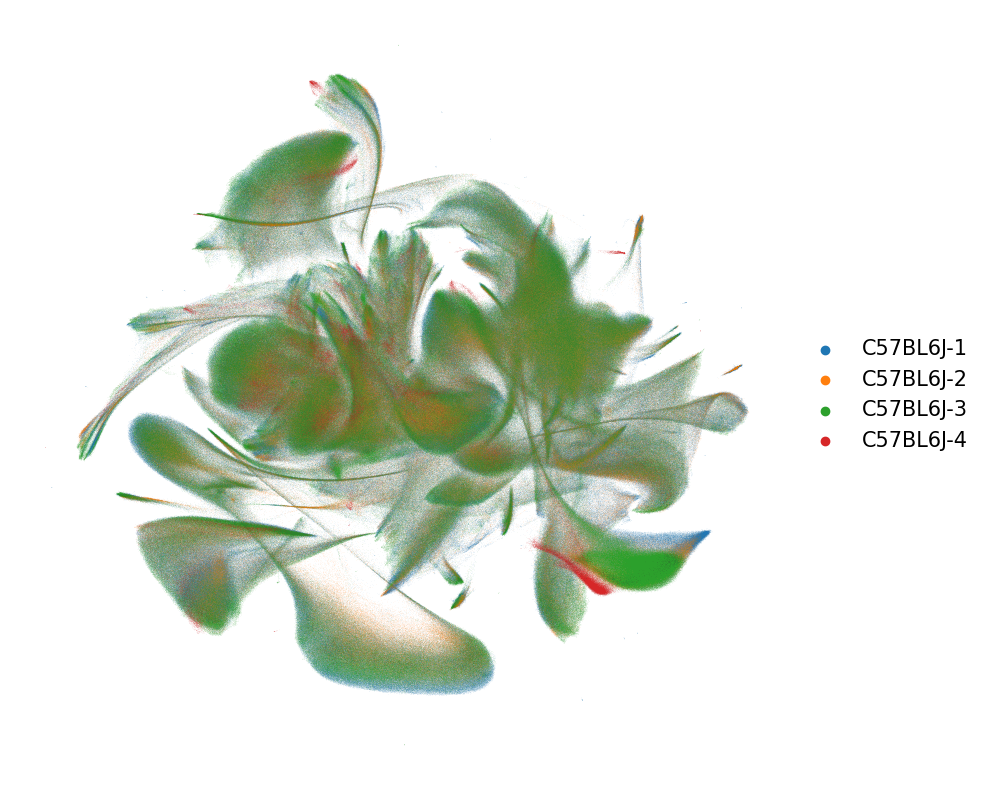

In [3]:
import matplotlib.pyplot as plt
import copy
plt.rcParams['figure.figsize'] = (10,10)
plt.rcParams['font.size'] = 15
sc.pl.umap(adata=adata,color='batch',title='',size=0.1,colorbar_loc=None,frameon=False)

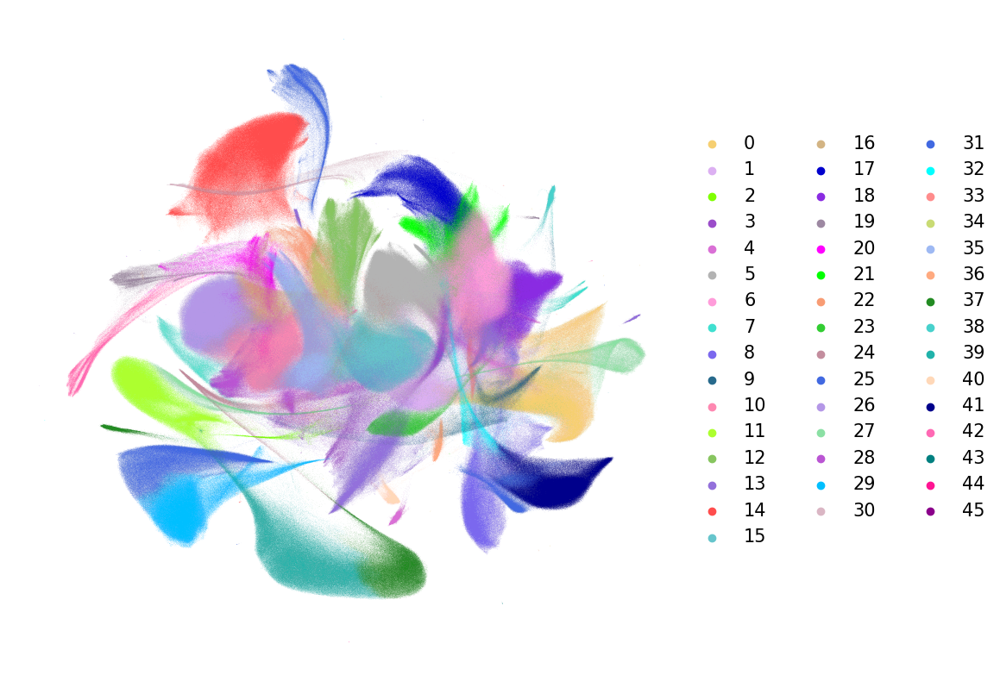

In [4]:
import matplotlib.pyplot as plt
import copy
plt.rcParams['figure.figsize'] = (10,10)
plt.rcParams['font.size'] = 15
latent_cluster_colors = create_new_color_dict(adata=adata,cat_key='SpaLP')
sc.pl.umap(adata=adata,color='SpaLP',title='',size=0.1,colorbar_loc=None,frameon=False,palette=latent_cluster_colors)

In [5]:
adata.obs['batch']

180539101816606833205351846956525086981    C57BL6J-1
182941331246012878296807398333956011710    C57BL6J-1
221260934538535633595532020856387724686    C57BL6J-1
22228792606814781533240955623030943708     C57BL6J-1
233157012195816530547593685593995814687    C57BL6J-1
                                             ...    
165336829713404196890968979758300983951    C57BL6J-4
208310273664740998320466646194827109394    C57BL6J-4
22952685842782775539589495413976810844     C57BL6J-4
266226389764367102976499556952863936382    C57BL6J-4
329803029697740405562675653447986491968    C57BL6J-4
Name: batch, Length: 8380288, dtype: category
Categories (4, object): ['C57BL6J-1', 'C57BL6J-2', 'C57BL6J-3', 'C57BL6J-4']

## <span style="color:black; font-weight:bold;">Multi-slice Niche identified by SpaLP in batch4</span>

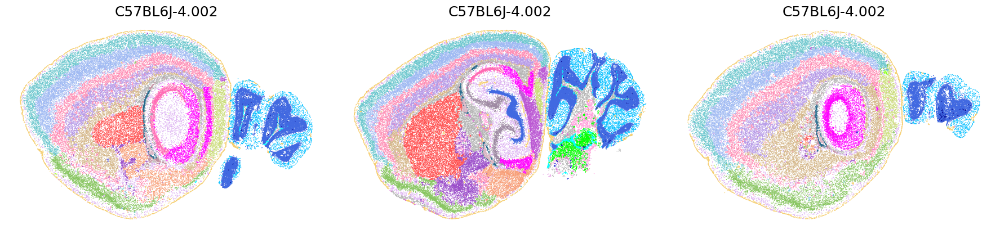

In [42]:
adata_batch4=adata[adata.obs['batch']=='C57BL6J-4']
samples = adata_batch4.obs['slice'].unique().tolist()
import matplotlib.pyplot as plt
import scanpy as sc
plt.rcParams['figure.figsize'] = (20, 20)
plt.rcParams['font.size'] = 15

samples = adata_batch4.obs['slice'].unique().tolist()

num_rows = 6  
num_cols = min(len(samples), 3)  

fig, axs = plt.subplots(num_rows, num_cols, figsize=(6 * num_cols, 4 * num_rows))
axs = axs.flatten()

for idx, sample in enumerate(samples):
    sc.pl.embedding(adata=adata_batch4[adata_batch4.obs['slice'] == sample], basis='spatial', color=['SpaLP'],title=samples, legend_loc=None, frameon=False, ax=axs[idx], show=False, palette=latent_cluster_colors, size=4, ncols=7)

for idx in range(len(samples), len(axs)):
    fig.delaxes(axs[idx])

plt.tight_layout()  
plt.show()

## <span style="color:black; font-weight:bold;">Multi-slice Niche identified by SpaLP in batch3</span>

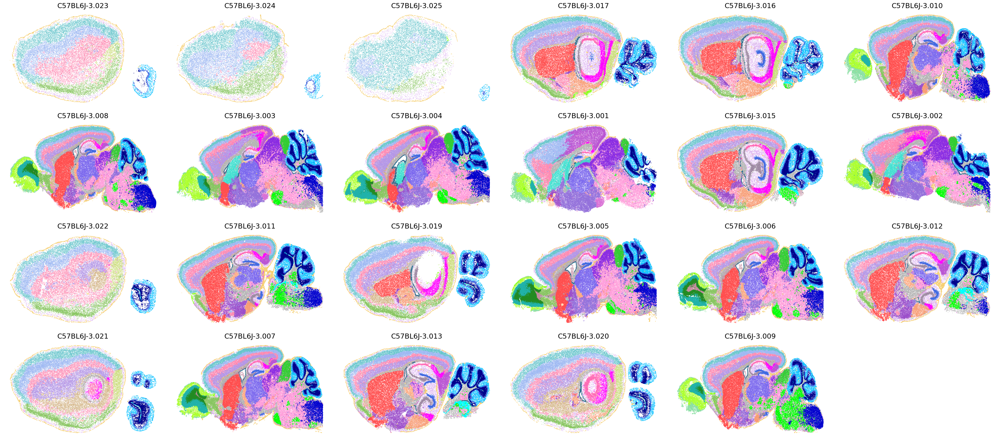

In [34]:
adata_batch3=adata[adata.obs['batch']=='C57BL6J-3']
samples = adata_batch3.obs['slice'].unique().tolist()
import matplotlib.pyplot as plt
import scanpy as sc
plt.rcParams['figure.figsize'] = (20, 20)
plt.rcParams['font.size'] = 15

num_cols = 6
num_rows = (len(samples) + num_cols - 1) // num_cols  

fig, axs = plt.subplots(num_rows, num_cols, figsize=(6 * num_cols, 4 * num_rows))
axs = axs.flatten()

for idx, sample in enumerate(samples):
    if idx < len(axs):  
        sc.pl.embedding(adata=adata_batch3[adata_batch3.obs['slice'] == sample], 
                        basis='spatial', 
                        color=['SpaLP'],
                        title=sample, 
                        legend_loc=None, 
                        frameon=False, 
                        ax=axs[idx], 
                        show=False, 
                        palette=latent_cluster_colors, 
                        size=6, 
                        ncols=7)

for idx in range(len(samples), len(axs)):
    fig.delaxes(axs[idx])

plt.tight_layout()  
plt.show()